# Final Project Notebook - Spring 2024

In [7]:
import matplotlib.pyplot as plt
# Import matplotlib's pyplot to create and manipulate plot objects for data visualization.

import imageio
# Import the imageio library to read, write, and process image files in various formats.

import torch
# Import PyTorch, a deep learning framework that provides tools to build and train neural network models.

import torchvision
# Import torchvision, a package that provides access to popular datasets, model architectures, and image transformations for computer vision.

from torchvision import models, transforms
# Import models and transforms from torchvision to access pre-trained models and common image transformations.

import numpy as np
# Import numpy for numerical operations and data manipulation, essential for handling arrays.

from torchvision.models import *
# Import specific models from torchvision to easily access and utilize popular pre-trained models.

from PIL import Image
# Import Image from PIL (Python Imaging Library) to open, manipulate, and save many different image file formats.

import requests
# Import requests to handle HTTP requests, which is useful for downloading data from the internet.

# from torchvision import models # Imported above in first instance

from torchsummary import summary
# Import summary from torchsummary to provide a quick summary of PyTorch models, showing the number of parameters, layer types, etc.

 ## Plot

 Display an image with specified properties.

 Parameters:
  x (array-like or PIL image): The image data. Can be any array-like structure that imshow can render.

  Description:
  This function takes an input image and displays it in grayscale without axes. The image is displayed at an enlarged size for better visualization.

  Uses:

  - matplotlib.pyplot.subplots to create a figure and a set of subplots.
  - imshow to display data as an image, i.e., on a 2D regular raster.
  - cmap='gray' to display the image in grayscale.

In [8]:
def plot(x):
    fig, ax = plt.subplots()
    # Create a figure and a single subplot

    im = ax.imshow(x,cmap='gray')
    # Display the image data 'x' using a grayscale color map.
    # 'imshow' is used to show image data, with 'cmap='gray'' specifying that the image should be shown in grayscale.

    ax.axis('off')
    # Disable axis to enhance image visibility without axes and ticks cluttering the view.

    fig.set_size_inches(20, 20)
    # Set the size of the figure to 20x20 inches to ensure the image is displayed at a sufficient size to be clearly visible.

    plt.show()
    # Display the figure containing the image.

In [9]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')

# Use imageio.imread to read an image from a specified URL. The image is loaded into the 'im' variable.
# This function supports reading from various sources and formats, and in this case, it fetches an image directly from a web URL.

<ipython-input-9-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


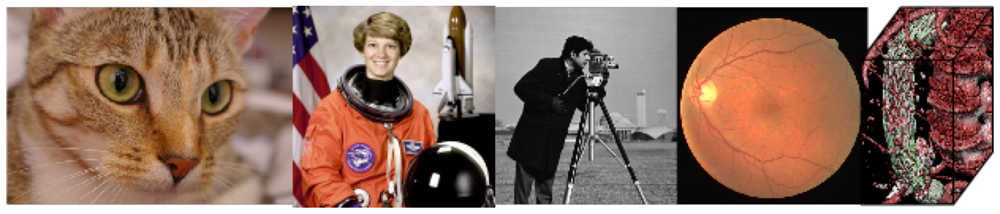

In [10]:
plot(im)

# Call the plot function defined earlier to display the image.
# The 'plot' function takes the image array and renders it in grayscale without any axes, with the plot size set to 20x20 inches.

In [12]:
# net = alexnet(pretrained=True).cuda(0) # Uncomment if fix for GPU fix found
                                         # I do not have an NVIDIA GPU on my computer

from torchvision.models import alexnet
# Import the alexnet model from torchvision's models module. AlexNet is a well-known architecture used primarily for image classification.

# Load the pretrained AlexNet model
# The 'pretrained=True' argument loads the model with weights trained on ImageNet.
net = alexnet(pretrained=True)

# Ensure the model is set to run on CPU
# The 'to('cpu')' method ensures that all model parameters and buffers are transferred to the CPU.
net = net.to('cpu')


Detailed Explanation

Normalization: The normalization transform adjusts pixel values based on the mean and standard deviation of the channels (RGB). These specific values are standard for models trained with ImageNet data, ensuring that the input image has similar distribution characteristics as the training data, which is crucial for model performance.

Transform Pipeline:

Resize: Adjusts the size of the image to ensure that it's large enough for the subsequent crop operation to extract meaningful features without losing important parts of the image.

Center Crop: This ensures the most important parts of the image, which are usually centered, are retained, cropping out potentially less informative borders.

ToTensor: Converts the image to a PyTorch tensor and scales the pixel values to [0, 1], which is a requirement for inputs into a neural network in PyTorch.

Normalize: Applies the specified normalization, which adjusts each channel of the tensor image by subtracting the mean and dividing by the standard deviation. This is done for each channel separately.

### Image Preprocessing Steps Explained

#### Normalization
```
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406], # Mean for each color channel
   std=[0.229, 0.224, 0.225]   # Standard deviation for each color channel
)
```

Normalization adjusts pixel values so that they represent a standard normal distribution. This is mathematically defined as:

$$ X' = \frac{X - \mu}{\sigma} $$

where:
- \(X\) is the original pixel value.
- \(\mu\) is the mean of the pixels across the dataset, specified per channel.
- \(\sigma\) is the standard deviation of the pixels, specified per channel.
- \(X'\) is the normalized pixel value.

Normalization ensures that each input feature (pixel) contributes proportionately to the final prediction, improving the numerical stability of the neural network.

#### Resize and Center Crop
```
transforms.Resize(256),          # Resize the input image to 256x256 pixels.
transforms.CenterCrop(224),      # Crop a central part of the image to 224x224 pixels, the input size AlexNet expects.
```

- **Resize**: Changes the image dimensions to a fixed size, using interpolation methods to calculate pixel values. This standardizes the size of all images before further processing.

- **Center Crop**: Reduces the image size further by cutting out the central part, ensuring that the most important parts of the image are preserved and standardized to the required input size for the neural network.

#### Conversion to Tensor
```
transforms.ToTensor(),           # Convert the image to a PyTorch tensor, which changes the range from [0, 255] to [0.0, 1.0].
```

- **ToTensor**: Converts an image to a PyTorch tensor and scales its pixel intensity values from [0, 255] to [0.0, 1.0]. This transformation is essential for learning, as models generally expect small input values.

### Overall Purpose

These transformations standardize the input for neural networks, ensuring they receive data in the format they expect and are optimized to process. This not only aids in better convergence during training but also in consistent performance during inference.


In [13]:
# Define a normalization step using predefined mean and standard deviation.
# These values (mean and std) are typically used for models trained on the ImageNet dataset.
# Normalization helps in making model training stable and faster by transforming every pixel.normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406], # Mean for each color channel
   std=[0.229, 0.224, 0.225]   # Standard deviation for each color channel
)

# Create a preprocessing pipeline that includes resizing, cropping, conversion to tensor, and normalization.
# This sequence of transformations prepares the image in the format required by pretrained models like AlexNet.
preprocess = transforms.Compose([
   transforms.Resize(256),          # Resize the input image to 256x256 pixels.
   transforms.CenterCrop(224),      # Crop a central part of the image to 224x224 pixels, the input size AlexNet expects.
   transforms.ToTensor(),           # Convert the image to a PyTorch tensor, which changes the range from [0, 255] to [0.0, 1.0].
   normalize                        # Apply the normalization defined above.
])

In [14]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')
# Use imageio.imread to load an image from the internet. This function reads an image from a URL and returns it as a numpy array.
# The provided URL links to an image of a golden retriever puppy.

<ipython-input-14-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


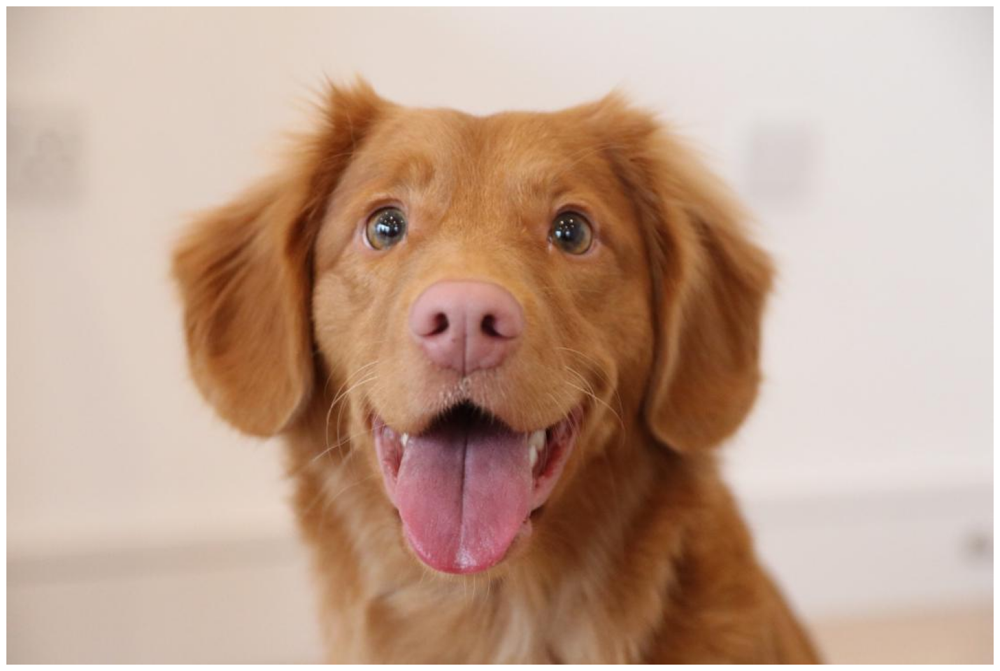

In [15]:
plot(im)
# Call the plot function defined earlier to display the image.
# The 'plot' function takes the image array and renders it in grayscale without any axes, with the plot size set to 20x20 inches.

Detailed Explanation and Verification

PIL Conversion: Converting to a PIL Image is essential because the transformation functions, particularly those in torchvision.transforms, are designed to operate on PIL Image objects for historical and compatibility reasons.

Preprocessing:

Resizing and Cropping: These ensure the model receives input at the size it was trained on (224x224 for models like AlexNet).

ToTensor and Normalize: Conversion to a tensor changes the image pixel values from [0, 255] to [0.0, 1.0], and normalization then adjusts these values based on the mean and standard deviation of the ImageNet dataset.

Adding a Batch Dimension:

The unsqueeze_(0) function adds a new dimension at the beginning of the tensor, effectively simulating a batch size of one. This is important because neural networks in PyTorch expect inputs to have a batch dimension, even when processing a single image.

Shape Verification:

After processing, printing img_tensor.shape helps confirm that the tensor is correctly shaped for input into a deep learning model. The expected shape is [1, 3, 224, 224], which you should see as output, indicating a single image (batch size = 1) with three color channels (RGB), each 224 pixels wide and 224 pixels high.

In [16]:
image = Image.fromarray(im) #convert to PIL
# Convert the numpy array (loaded by imageio.imread) to a PIL Image.
# This conversion is necessary because the preprocessing pipeline expects a PIL Image format.

In [17]:
img_tensor = preprocess(image)
# Apply the predefined preprocessing transformations to the image.
# This includes resizing, center cropping, converting to tensor, and normalization.

In [18]:
img_tensor = img_tensor.unsqueeze_(0)
# Add a batch dimension to the image tensor.
# Pretrained models expect inputs to have a batch dimension, so we use unsqueeze_ to add it in-place.

In [19]:
img_tensor.shape
# Print the shape of the tensor to verify dimensions.
# Expected output is [1, 3, 224, 224], representing [batch size, color channels, height, width].

torch.Size([1, 3, 224, 224])

Detailed Explanation

Device Handling:

Your script smartly determines whether to use CUDA (GPU) based on availability, ensuring compatibility across different environments without manual adjustments.

Image Tensor Preparation:

Before using the image tensor for model inference, it is cloned and detached to prevent changes to the original data and unnecessary computation of gradients, respectively. It’s also moved to the determined device (GPU or CPU).

Model Inference:

The model, assumed to be loaded earlier as net, receives the prepared image tensor. The model's forward pass computes the logits representing the predicted probabilities of each class.

Predicted Label:

After inference, the output is processed to find the most likely class using argmax, which is useful for classification tasks.

Top Predictions:

To find the top 10 predicted classes, argsort is used on the output scores to get the indices sorted by prediction confidence. np.flip reverses this to start from the highest.

In [21]:
# img_variable = torch.tensor(img_tensor).cuda(0)

# I do not have an NVIDIA GPU on my computer

# Check if CUDA is available and set the device accordingly.
# If CUDA is not available, the model will run on CPU.
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Prepare the image tensor for input to the model.
# Clone the tensor to ensure that any changes do not affect the original tensor, detach it from its current graph to avoid gradient calculations, and move it to the appropriate device (GPU or CPU).
img_variable = img_tensor.clone().detach().to(device)


In [22]:
out = net(img_variable)
# Forward pass through the network to get the output logits.
# The net object is assumed to be a pretrained model loaded earlier.

In [23]:
label_index = out.cpu().data.numpy().argmax()
# Convert the output logits to a numpy array and use argmax to find the index of the maximum score, which corresponds to the predicted label.

In [24]:
label_index
# Output the predicted label index.

207

In [25]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])
# Retrieve the indices of the top 10 predictions.
# The scores are first transferred to CPU and converted to numpy. Argsort is then used to sort them, and flip is used to reverse the order to get the highest scores at the front.

In [26]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json'
# URL to the JSON file containing class labels for the pretrained model (e.g., AlexNet on ImageNet).

In [27]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()}
# Download the labels JSON file and convert it into a Python dictionary.
# The dictionary keys are parsed as integers for direct indexing later on.

In [28]:
print(labels[label_index])
# Print the label corresponding to the predicted class index.

golden retriever


In [29]:
# Loop through the indices of the top 10 predictions and print their corresponding labels.
for i in range(10):
    print(labels[top_list[i]])

golden retriever
Irish setter, red setter
Brittany spaniel
Sussex spaniel
clumber, clumber spaniel
tennis ball
cocker spaniel, English cocker spaniel, cocker
Tibetan mastiff
chow, chow chow
Blenheim spaniel


In [30]:
net
# Display the neural network architecture; useful for understanding the model structure.

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [31]:
summary(net, (3, 224, 224))
# Use the summary function from torchsummary to provide a detailed summary of the model,
# including the total number of parameters and the output shape of each layer.
# The input size is specified as (3, 224, 224), which corresponds to the expected input
# dimensions for models trained on ImageNet (3 color channels, 224x224 pixels).

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

Detailed Explanation

Feature Extraction Visualization:

The first part of your code visualizes the feature maps from the first convolutional layer. This helps in understanding the initial layer's response to the input image, which can be crucial for debugging and improving model layers.

Classifier Output Plotting:

The second plot demonstrates the classifier's outputs before the final classification layer (assuming net.classifier[0:6] does not include the final layer if it exists). This part flattens the output after average pooling and runs it through part of the classifier to see intermediate responses.

Ensure that net.classifier[0:6] accurately represents the sections of the classifier you intend to analyze, as incorrect layer indices can lead to misleading visualizations or errors.

In [32]:
out = net.features[0](img_variable).cpu().detach().numpy()
# Perform the forward pass through the first layer of the model's feature extractor on the input image tensor.
# The output is then moved to CPU, detached from the computational graph, and converted to a NumPy array for visualization.

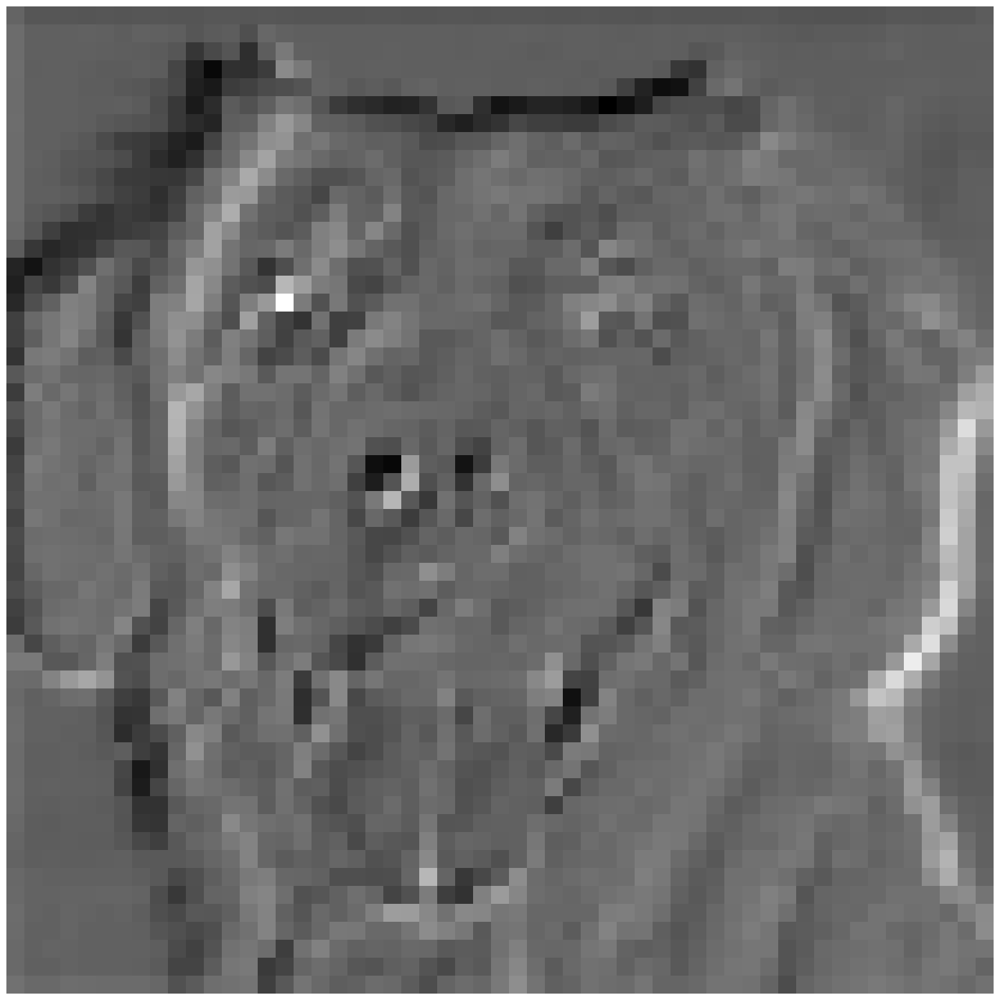

In [33]:
plot(out[0,0,:,:])
# Use the 'plot' function to visualize the output of the first filter in the first layer.
# This shows the activation maps, helping in understanding what features the first convolutional layer is focusing on.

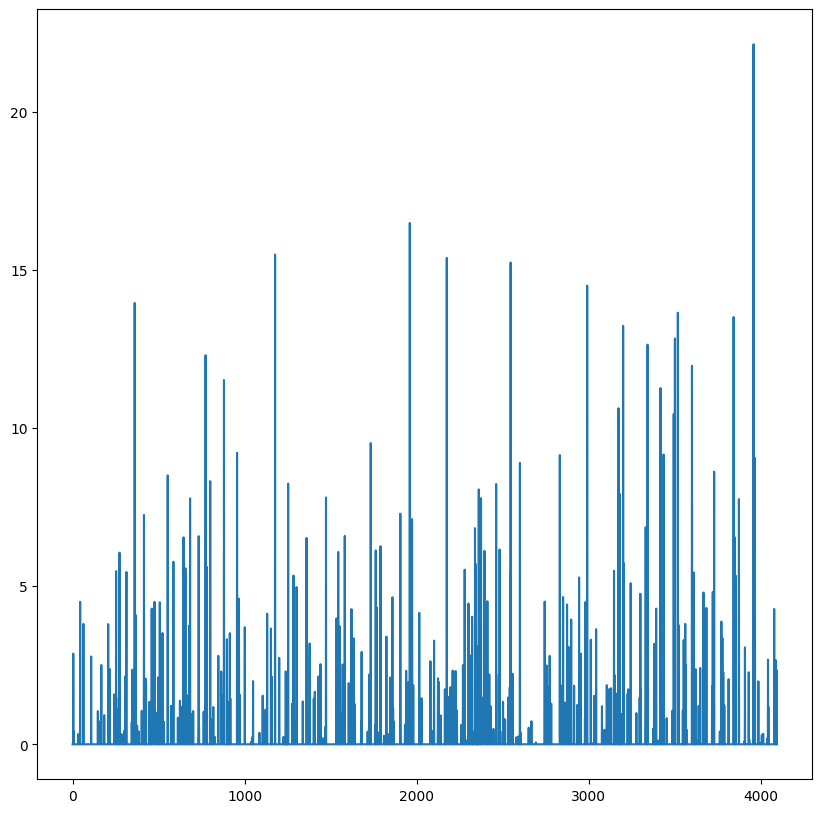

In [34]:
# Plot the output of the classifier layers.
# Here we take the output after the 13th layer of the features submodule, apply average pooling, and then pass it through the classifier.
# The output is then processed similarly by moving to CPU, detaching, and converting to NumPy for plotting.

plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy())
# Get the current figure using plt.gcf and set its size to 10x10 inches for better visibility.
fig = plt.gcf()
fig.set_size_inches(10, 10)

In [49]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')
# Use imageio to load an image from a URL, which currently points to a dynamically updated image source.

<ipython-input-49-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


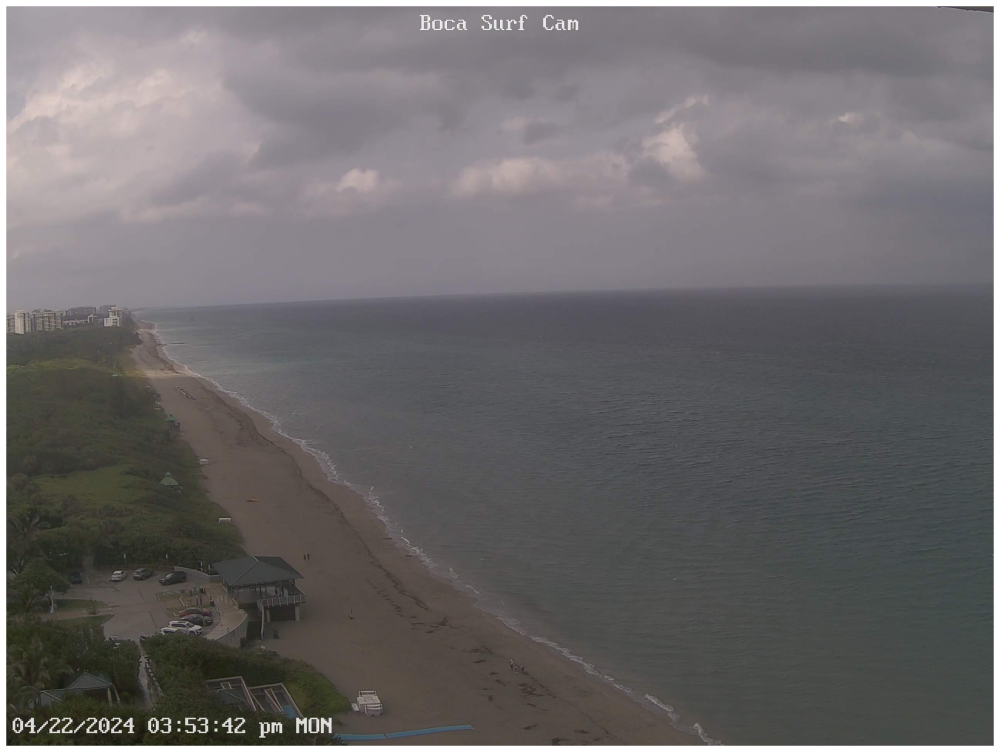

In [36]:
plot(im)
# Plot the loaded image using the previously defined 'plot' function to visually verify its contents.

In [45]:
# def load_im(im):
#    image = Image.fromarray(im) #convert to pil
#    img_tensor = preprocess(image)
#    img_tensor = img_tensor.unsqueeze_(0)
#    img_variable = torch.tensor(img_tensor).cuda(0)
#    return img_variable

# I do not have a NVIDIA GPU

from PIL import Image

# Define a function to load and preprocess an image.
def load_im(im):

     # Convert the numpy array (loaded image) to a PIL Image to make it compatible with torchvision transforms.
    image = Image.fromarray(im)  # Convert to PIL image

    # Apply the predefined preprocessing pipeline to the PIL image. This typically includes resizing, cropping, normalization, etc.
    img_tensor = preprocess(image)  # Apply preprocessing

     # Add a batch dimension to make the tensor compatible with the neural network's expected input format.
    img_tensor = img_tensor.unsqueeze_(0)  # Add batch dimension

     # Clone and detach the tensor from the current computation graph to avoid gradient tracking, which is unnecessary for inference.
    img_variable = img_tensor.clone().detach()  # Avoid unnecessary graph retention

    # Return the preprocessed image tensor, which is already configured to be processed on CPU by default.
    return img_variable  # Already on CPU by default


In [46]:
# out = net(load_im(im))

# Ensure the neural network model (net) is transferred to CPU.
net = net.to('cpu')  # Ensure the model is on the CPU

# Perform inference using the neural network on the loaded and preprocessed image.
out = net(load_im(im))  # Assuming 'preprocess' is a function or transform


In [47]:
# Define a function to handle inference and print the predicted label along with the top 10 predictions.
def inference(im):

    # Perform model inference using the preprocessed image.
    out = net(load_im(im))

    # Find the index of the highest logit which corresponds to the predicted label.
    label_index = out.cpu().data.numpy().argmax()

    # Retrieve the indices of the logits corresponding to the top 10 predictions.
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:])

    # Print the predicted label using the 'labels' dictionary.
    print(labels[label_index])
    print('____')

    # Print the labels corresponding to the top 10 predictions.
    for i in range(10):
        print(labels[top_list[i]])

In [48]:
# Call the inference function with the image to display the model's predictions.
inference(im)

promontory, headland, head, foreland
____
promontory, headland, head, foreland
volcano
wing
dam, dike, dyke
sandbar, sand bar
valley, vale
seashore, coast, seacoast, sea-coast
fireboat
lakeside, lakeshore
alp


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

In [1]:
%%capture
# This magic command suppresses the output of the current cell to keep the notebook tidy.

!pip install wandb
# Install the Weights & Biases library to track experiments, visualize model performance, and store model artifacts.

!apt-get install poppler-utils
# Install poppler-utils, a collection of tools to manage PDF files, needed for converting PDFs to images.

!pip install pdf2image
# Install pdf2image library for converting PDF documents to images, used for processing PDF data.

!pip install flashtorch
# Install flashtorch for visualizing CNN layers and understanding feature detection in models.

import requests
# Import the requests module to handle HTTP requests, useful for downloading or interacting with web data.

from pdf2image import convert_from_path
# Import convert_from_path from pdf2image for converting PDF files located at a specific path to images.

import matplotlib.pyplot as plt
# Import matplotlib's pyplot to create and manipulate plot objects.

import numpy as np
# Import numpy for numerical operations and data manipulation.

import torch
# Import PyTorch for building and training neural networks.

# import requests # Redundant import requests function

from torchvision import *
# Import torchvision for accessing pre-trained models and computer vision data transformation methods.

from torchvision.models import *
# Import specific models from torchvision to access pre-trained computer vision models.

from flashtorch.utils import apply_transforms
# Import apply_transforms from flashtorch.utils to apply pre-defined transformations suitable for CNN visualizations.

import wandb as wb
# Import the wandb module with alias wb to initialize and use Weights & Biases for experiment tracking.

Convert data into a PyTorch tensor that is placed on a GPU and enables gradient computation.

  Parameters:
  data (array-like): Data to be converted into a tensor. This could be a list, numpy array, etc.

  Returns:
  torch.Tensor: A tensor with gradients computation enabled, located on GPU.

  Description:
  This function is useful for converting data that will be used in training, where gradient computation is necessary.

  -

Convert data into a PyTorch tensor that is placed on a GPU without enabling gradient computation.

  Parameters:
  data (array-like): Data to be converted into a tensor. This could be a list, numpy array, etc.

  Returns:
  torch.Tensor: A tensor with no gradients computation, located on GPU.

  Description:
  This function is useful for converting data that will be used in model evaluation or inference,
  where gradient computation is not necessary.

In [2]:
def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))
# Create a PyTorch tensor from data, enable gradient computation, ensure it is of type float,
# and move it to the GPU device.

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))
# Create a PyTorch tensor from data, disable gradient computation, ensure it is of type float,
# and move it to the GPU device.

Displays an image in grayscale with axes turned off.

  Parameters:
  x (array-like or PIL image): The image data to be plotted. This could be a numpy array or a PIL image.

  Description:
  This function creates a plot using matplotlib to display an image in grayscale.
  
  The axes are removed to focus solely on the image content, and the image size is set to 5x5 inches.

In [3]:
def plot(x):
    fig, ax = plt.subplots()
     # Create a figure and a subplot with a single axes.

    im = ax.imshow(x, cmap = 'gray')
    # Display the image 'x' in grayscale.

    ax.axis('off')
    # Hide the axes to enhance visual clarity of the image.

    fig.set_size_inches(5, 5)
     # Set the size of the figure to be 5 inches by 5 inches.

    plt.show()
    # Show the plot.

## Get Google Slides

Constructs a URL to directly download a specific Google Slide as a PDF.

  Parameters:
  url (str): The full URL of the Google Slide.

  Returns:
  str: A modified URL that when accessed downloads the specified slide as a PDF.

  Description:
  This function parses the provided Google Slide URL to extract necessary identifiers,and reassembles them into a URL that facilitates the direct download of the slide.

## Get Slides

Downloads Google Slides as images from a given URL.

  Parameters:
  url (str): The full URL of the Google Slide.

  Returns:
  list: A list of images, each representing a slide from the downloaded PDF.

  Description:
  This function downloads a PDF from a modified Google Slide URL and converts each page of the PDF into an image.
    

## Load

Applies necessary transforms to an image and loads it as a PyTorch tensor.

   Parameters:
  image (PIL.Image): The image to transform and load.

  Returns:
  torch.Tensor: A PyTorch tensor of the transformed image, ready for model input.

  Description:
  This function applies predefined transformations suitable for model inputs, and converts the image to a tensor.
    

In [4]:
def get_google_slide(url):

    url_head = "https://docs.google.com/presentation/d/"
    # Base URL for accessing Google Slides.

    url_body = url.split('/')[5]
    # Extract the presentation ID from the URL.

    page_id = url.split('.')[-1]
    # Extract the slide-specific part of the URL.

    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id
    # Construct the export URL that targets a specific slide for download.

def get_slides(url):

    url = get_google_slide(url)
    # Generate the URL to fetch the slide as a PDF.

    r = requests.get(url, allow_redirects=True)
    # Request the PDF file from the generated URL.

    open('file.pdf', 'wb').write(r.content)
     # Write the received content to a local PDF file.

    images = convert_from_path('file.pdf', 500)
    # Convert the downloaded PDF file into images, with a DPI of 500 for high quality.
    return images

def load(image):

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device)
    # Apply transformations, clone to ensure no changes to original data, detach from graph, enable gradients, and move to the device.

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# Determine the device to run the model on, using GPU if available, otherwise CPU.

In [5]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}
# Dictionary comprehension to fetch labels from a URL and convert them into a dictionary.
# The keys are converted from strings to integers to facilitate indexing later.

In [6]:
model = alexnet(weights='DEFAULT').to(device)
# Load a pretrained AlexNet model.
# The 'weights' parameter specifies using the default pretrained weights.
# The model is then moved to the designated computing device (CPU or GPU).

model.eval();
# Set the model to evaluation mode.
# This is important because models behave differently during training vs. during testing/evaluation,
# such as in how they handle batch normalization and dropout.

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 92.6MB/s]


In [7]:
url = "https://docs.google.com/presentation/d/1D7mEvdhJ5gpl2IEcZoW5eGg5wENB7TVXLF4bXg5YePU/edit#slide=id.g2b78f0cdd83_0_240"
# URL for a specific custom Google Slide.
# This URL is typically used later to download or process the slide for tasks such as classification or feature extraction.

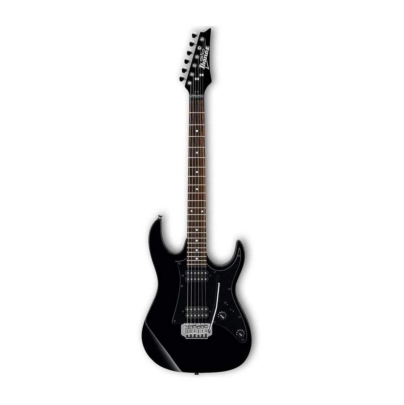

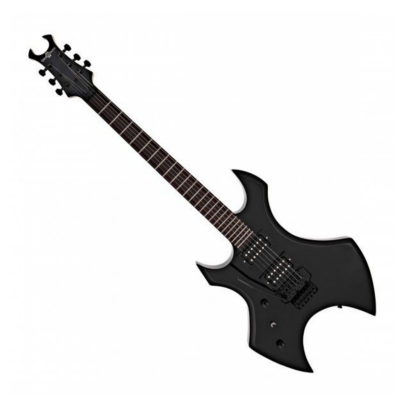

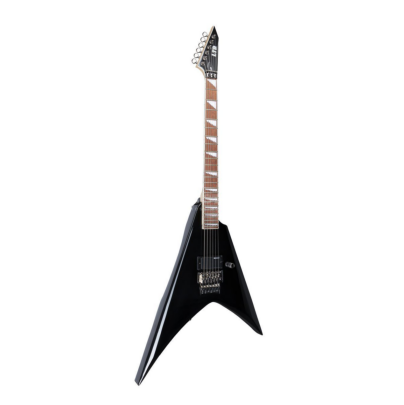

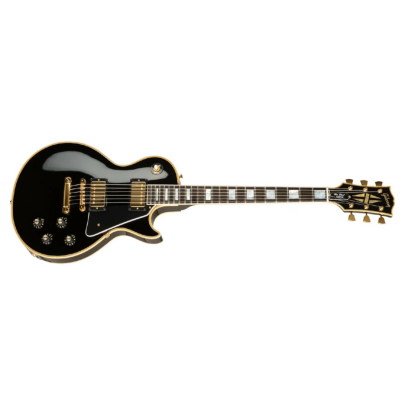

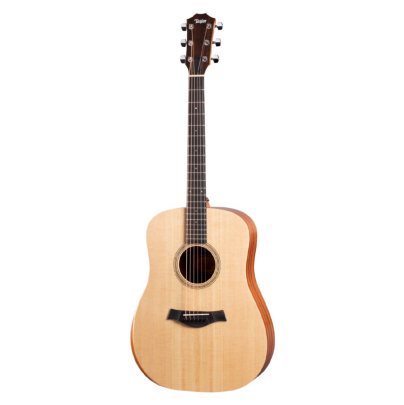

...

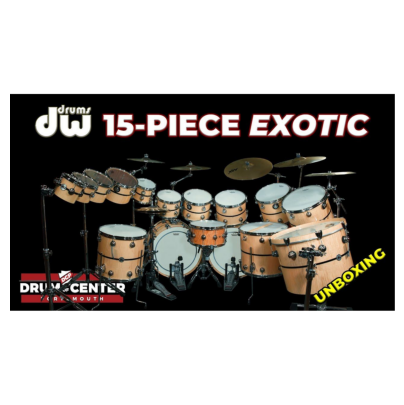

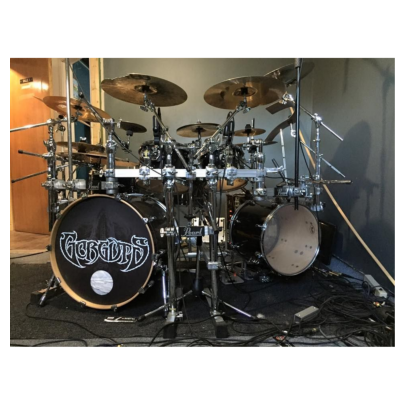

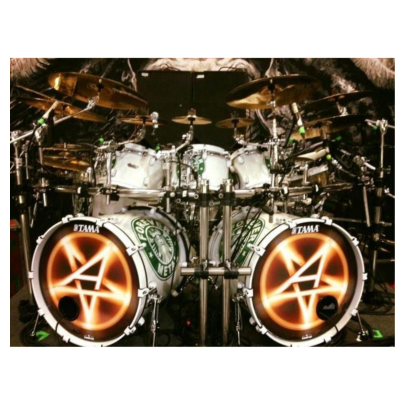

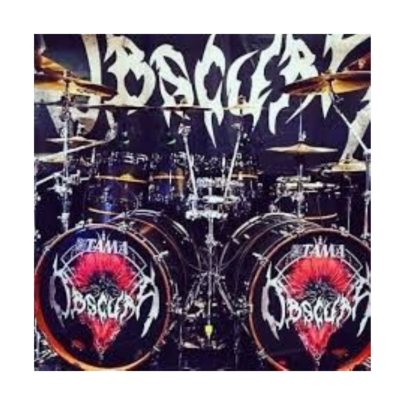

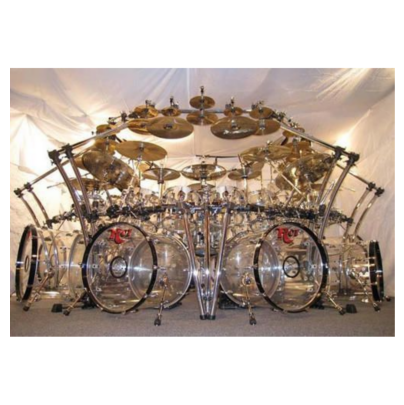

In [8]:
images = []
# Initialize an empty list to hold processed images.

for image in get_slides(url):
  # Iterate over each image returned by the get_slides function, which converts each slide from a Google Slide URL into images.

    plot(image)
    # Display each slide using the plot function defined previously, which shows the image in a matplotlib plot.

    images.append(load(image))
    # Apply preprocessing to the image (such as transformations and converting it to a tensor) using the load function,
    # then append the processed image tensor to the 'images' list.

images = torch.vstack(images)
# Apply preprocessing to the image (such as transformations and converting it to a tensor) using the load function,
# then append the processed image tensor to the 'images' list.

In [9]:
images.shape
# Obtain the shape of the 'images' tensor.
# This will display the dimensions of the tensor, indicating the number of images and their respective sizes.

torch.Size([50, 3, 224, 224])

In [10]:
model(images)
# Pass the batch of preprocessed images through the model to get the output predictions.
# This is typically a forward pass through a neural network, and 'model' should be in evaluation mode.

tensor([[-2.3639, -3.2431, -4.2830,  ..., -4.1982,  0.1463,  1.6443],
        [-1.9161, -3.8593,  0.8238,  ..., -4.2004, -0.8384,  1.0666],
        [-3.6617, -0.8713,  1.4824,  ..., -4.8241, -0.5564, -0.4319],
        ...,
        [-4.1743, -1.8010, -1.0146,  ...,  0.0545,  2.0854,  1.8661],
        [-2.7174, -1.0028, -2.4738,  ..., -1.4194, -1.1015,  2.3113],
        [-4.1138, -2.0978, -4.2546,  ..., -3.2409,  3.2983,  0.8090]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [11]:
y = model(images)
# Store the output predictions from the model for further processing.
# It is common to reassign to a new variable for clarity or further operations.

In [12]:
y.shape
# Obtain the shape of the 'y' tensor.
# This will indicate the batch size and the number of output classes, showing the output structure of the model.

torch.Size([50, 1000])

In [13]:
guesses = torch.argmax(y, 1).cpu().numpy()
# Compute the predicted class indices for each image in the batch by finding the maximum logit (predicted probabilities) along the class dimension.
# The 'argmax' function is used here to determine the index of the highest value in each prediction vector.

In [14]:
# Iterate through the list of predicted class indices and print the corresponding class labels using the 'labels' dictionary.
for i in list(guesses):
    print(labels[i])

electric guitar
electric guitar
missile
corkscrew, bottle screw
acoustic guitar
screw
chain saw, chainsaw
screw
hook, claw
acoustic guitar
chain saw, chainsaw
acoustic guitar
chain
acoustic guitar
assault rifle, assault gun
can opener, tin opener
lipstick, lip rouge
hammer
microphone, mike
acoustic guitar
acoustic guitar
hook, claw
electric guitar
pencil box, pencil case
electric guitar
drum, membranophone, tympan
drum, membranophone, tympan
drum, membranophone, tympan
drum, membranophone, tympan
drum, membranophone, tympan
scale, weighing machine
pencil sharpener
barber chair
drum, membranophone, tympan
drum, membranophone, tympan
barber chair
desk
drum, membranophone, tympan
hair slide
oxygen mask
hair slide
drum, membranophone, tympan
drum, membranophone, tympan
drum, membranophone, tympan
drum, membranophone, tympan
wallet, billfold, notecase, pocketbook
buckle
pretzel
wallet, billfold, notecase, pocketbook
chest


In [15]:
Y = np.zeros(50,)
# Create an array 'Y' of zeros with length 50.

Y[25:] = 1
# Set the second half of the array to 1, making it a binary target array used for classification tasks.
# This indicates two classes, where the first half is class 0 and the second half is class 1.

In [16]:
Y
# Print the array 'Y' to verify its contents.

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [17]:
X = y.detach().cpu().numpy()
# Assuming 'y' is a PyTorch tensor, likely containing output from a model (e.g., logits or probabilities),
# detach it from the computation graph, move it to CPU memory, and convert it to a NumPy array.

In [18]:
X.shape
# Print the shape of the array 'X' to ensure it's correctly formatted and to understand its dimensions.
# This is typically (number of samples, number of output features/classes).

(50, 1000)

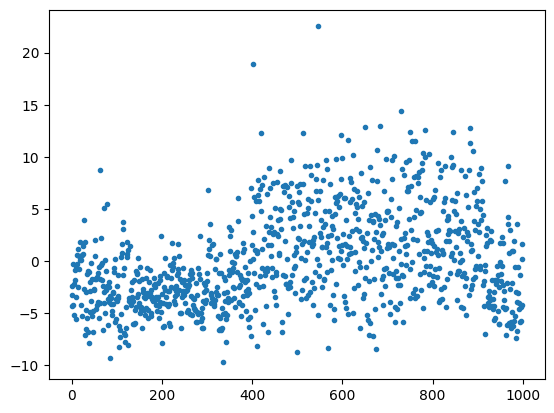

In [19]:
plt.plot(X[0],'.')
# Plot the first row of 'X' using matplotlib to visualize the predictions or output features for the first sample.
# This can be helpful for analyzing the behavior of a model's output.

In [20]:
X[0]
# Output the first row of 'X' to inspect its values.
# This might display the raw logits or probabilities of belonging to each class, depending on the model's final layer.

array([-2.3638744e+00, -3.2431211e+00, -4.2830276e+00, -4.2523413e+00,
       -2.7424800e-01, -2.2192597e+00, -5.2256427e+00, -8.9526474e-01,
       -1.8437411e+00, -4.6074075e-01, -3.4341943e+00, -5.6215000e+00,
       -3.0688787e-01,  6.1082900e-01,  1.1839340e+00, -2.5195673e+00,
       -8.2291049e-01,  4.4387114e-01,  4.4398069e-02,  1.7863115e+00,
       -4.2193985e+00,  4.2962483e-01,  7.5509161e-02,  5.7099468e-01,
       -5.2689266e+00,  1.4026895e+00,  6.8801016e-01, -2.7172799e+00,
        3.8973651e+00,  1.8277428e+00, -7.0915651e+00, -6.5553713e+00,
       -4.7246237e+00, -3.0171640e+00, -1.2298020e+00, -5.4595380e+00,
       -9.6263927e-01, -6.8018179e+00, -1.0954499e+00, -7.8773293e+00,
       -1.9790553e+00, -2.9057138e+00, -4.9331002e+00, -3.8259358e+00,
       -2.1108484e-01, -1.7838402e+00, -5.3009748e+00, -4.7775354e+00,
       -6.8043423e+00, -2.8408456e+00, -2.6944785e+00, -1.7727082e+00,
        4.2507222e-01,  2.0287642e+00, -1.6979680e+00, -4.6475554e+00,
      

In [37]:
np.argmax(X[0])
# Find the index of the maximum value in the first row of array X.

TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

In [22]:
labels[948]
# Access the label for index 948 from the labels dictionary.

'Granny Smith'

In [23]:
top_ten = np.argsort(X[0])[::-1][0:10]
# Sort the indices of X[0] in descending order and take the top ten.

In [24]:
# Print the labels for the top ten indices.
for i in top_ten:
    print(labels[i])

electric guitar
acoustic guitar
plunger, plumber's helper
oboe, hautboy, hautbois
microphone, mike
vacuum, vacuum cleaner
screw
quill, quill pen
syringe
corkscrew, bottle screw


In [25]:
labels
# Output all labels to check what they are.

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 33., 234., 294., 215., 115.,  78.,  26.,   3.,   1.,   1.]),
 array([-9.75307846, -6.52669239, -3.30030584, -0.07391968,  3.15246654,
         6.37885284,  9.60523891, 12.83162498, 16.05801201, 19.28439713,
        22.51078415]),
 <BarContainer object of 10 artists>)

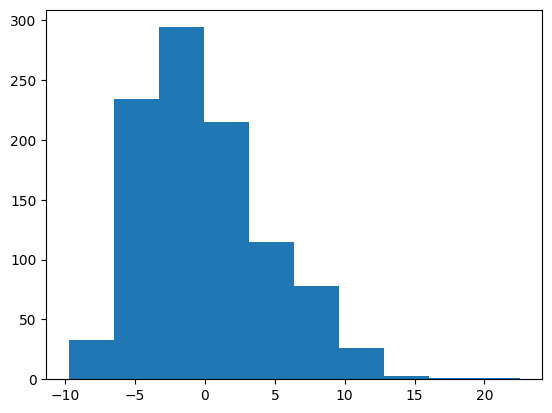

In [26]:
plt.hist(X[0])
# Plot a histogram of the values in the first row of X.

In [27]:
X = GPU_data(X)
# Convert the numpy array X to a GPU-compatible PyTorch tensor without gradient requirement.

Y = GPU_data(Y)
# Convert the numpy array Y to a GPU-compatible PyTorch tensor without gradient requirement.

## Softmax

This custom softmax function takes logits (x) as input and returns the softmax probabilities. It first stabilizes the input by subtracting the maximum logit value per batch (to prevent numerical overflow), then computes the exponential of the adjusted logits, and finally normalizes these values by the sum of the exponentials for each sample in the batch. This results in a probability distribution over classes for each input.

```
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s
```
Mathematical Concept: Softmax converts logits to probabilities that sum to one across the classes, applicable in multi-class classification.


$$
\text{Softmax}(x_i) = \frac{e^{x_i}}{\sum_{j} e^{x_j}}
$$

Exponential Function: Used due to its mathematical properties which help in emphasizing larger values and suppressing smaller ones, suitable for probability transformations.
Division by the Sum of Exponentials: Ensures the outputs sum to one, forming a valid probability distribution.

In [28]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    # Subtract the max value from each element in the input tensor along the specified axis (axis 1).
    # This helps in preventing overflow issues when computing the exponential.

    s = s1 / s1.sum(1)[:,None]
    # Sum the exponentials across the specified axis (axis 1) and then divide each element by this sum.
    # This normalizes the elements so that their sum will equal 1, creating a probability distribution.

    return s
    # Return the resulting softmax probability tensor.

## Cross Entropy

This function computes the cross-entropy loss between predictions (outputs) and true labels (labels). It applies the softmax function to the outputs to get a probability distribution, then uses these probabilities to calculate the logarithm. The function collects the log probabilities corresponding to the true class labels (using advanced indexing) and averages the negative sum across the batch for the loss.

```
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]
```
Mathematical Concept: Cross-entropy loss is a probability measure used in classification tasks, which compares the similarity between two probability distributions - the predicted probabilities (from the model outputs) and the actual distribution (from the labels). It is defined as:

$$
H(p, q) = -\sum_x p(x) \log q(x)
$$

where

p is the true distribution and

q is the predicted distribution. In the context of machine learning,

p is typically a one-hot encoded vector of actual labels, and

q is the predicted probability of these labels obtained via the softmax function.

Softmax Function: Transforms logits (outputs of the last linear layer of a neural network) into probabilities that sum up to one.

Logarithm of Probabilities: The logarithm is used because it is a monotonically increasing function, transforming multiplication of probabilities into sums, which simplifies the calculation (especially underflow problems).

Summation and Averaging: Summing over all instances provides a total measure of loss across the batch, and averaging (dividing by batch size) scales this total based on the number of examples, providing a consistent scale irrespective of batch size.

In [29]:
def cross_entropy(outputs, labels):
   # Apply the softmax function to the outputs tensor to get the probabilities, then take the log of these probabilities.
    # Subtract the maximum of each vector from its corresponding vector elements for numerical stability before softmax.
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]
    # Calculate the cross-entropy loss:
    # 1. Access the log probabilities corresponding to the true class labels using advanced indexing.
    # 2. Sum all the selected log probabilities.
    # 3. Negate the sum to calculate the loss (since the correct class log probabilities are negative).
    # 4. Average the loss over all examples in the batch.

## Truncated Normal

Implements a form of the Box-Muller transformation to generate random numbers following a normal distribution, specifically a form of truncated normal distribution by bounding the uniform random numbers used in the transformation.

```
w = [GPU(Truncated_Normal((1000,2)))]
```
Mathematical Concept: Initialization using a truncated normal distribution is based on the idea of controlling the variance of neuron activations and gradients during the initial phase of training, improving convergence behavior.

Truncated Normal Distribution: This is a normal distribution where values that fall outside a certain boundary are excluded. This prevents the initialization of weights that are too far from the mean, which can adversely affect training dynamics (e.g., vanishing or exploding gradients).

In [30]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    # Generate random numbers u1 and scale them appropriately.
    # The scaling and shifting ensure that u1 is truncated by exp(-2) at the lower bound,
    # meaning u1 values are in the range [exp(-2), 1].

    u2 = torch.rand(size)
    # Generate another set of random numbers u2 uniformly distributed between 0 and 1.

    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)
    # Compute the z values using the inverse transform sampling method.
    # This involves transforming uniformly distributed u1 and u2 into samples of a truncated normal distribution.
    # Here, z is obtained by applying the Box-Muller transformation to generate normally distributed numbers.

    return z
    # Return the generated truncated normal samples.

## Accuracy

Calculates the accuracy of predictions (out) by comparing the predicted labels (found by taking the argmax of out) with the true labels (y). The result is the proportion of correct predictions over the total number of predictions. The use of torch.no_grad() indicates that gradient calculations are not necessary for this operation, which is common during evaluation to save memory and computation.

```
def acc(out, y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]
```
Mathematical Concept: This snippet calculates the model accuracy, which is the proportion of correct predictions over total predictions.


$$
\text{Accuracy} = \frac{\text{Number of Correct Predictions}}{\text{Total Number of Predictions}}
$$


Argmax Function (torch.max(out, 1)[1]): Identifies the class with the highest predicted probability. This is where probability directly connects with categorical outcomes.
Equality Check (==): Compares predicted labels with true labels. Each correct prediction (true positive) contributes to the numerator.
Sum and Division: The sum of correct predictions divided by the total predictions gives the probability that a randomly selected sample is correctly classified.

In [31]:
def acc(out,y):
    with torch.no_grad():
    # Temporarily sets all the required gradient calculations to off,
    # ensuring that the computations within this block are more memory efficient and slightly faster
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]
        # Calculate the accuracy of the model's predictions:
        # torch.max(out, 1) returns both the maximum values and their corresponding indices across the first dimension,
        # where [1] accesses the indices (predicted class labels).
        # These predictions are then compared with the true labels 'y'.
        # The comparison (==) results in a tensor of type bool where True represents a correct prediction.
        # torch.sum converts this boolean tensor to a sum of integers (number of True values),
        # which represents the count of correct predictions.
        # .item() converts the resulting tensor value to a Python number.
        # Finally, divide the number of correct predictions by the total number of samples (y.shape[0])
        # to obtain the accuracy as a proportion.

In [32]:
X.shape
# Prints shape of X

torch.Size([50, 1000])

## Get Batch

This function fetches a batch of data for training or testing. It randomly selects a starting index r and slices b samples from the datasets X or X_test, and their corresponding labels Y or Y_test.

In [33]:
def get_batch(mode):
    b = c.b
    # 'b' is assumed to be a batch size defined somewhere in your code as c.b, likely in a class or globally.

    if mode == "train":
    # Check if the mode is set to "train" to fetch data from the training dataset.

        r = np.random.randint(X.shape[0]-b)
        # Randomly select a starting index 'r' for the batch in the training dataset.
        # 'X.shape[0]-b' ensures that the batch fetched does not go out of the array bounds.

        x = X[r:r+b,:]
        # Slice the training data 'X' from index 'r' to 'r+b' to get 'b' samples.
        # 'x' will contain the input features for the batch.

        y = Y[r:r+b]
        # Similarly, slice the training labels 'Y' from index 'r' to 'r+b' to get the corresponding labels.

    elif mode == "test":
    # Check if the mode is set to "test" to fetch data from the test dataset.

        r = np.random.randint(X_test.shape[0]-b)
        # Randomly select a starting index 'r' for the batch in the test dataset.

        x = X_test[r:r+b,:]
        # Slice the test data 'X_test' from index 'r' to 'r+b' to get 'b' samples.
        # 'x' will contain the input features for the test batch.

        y = Y_test[r:r+b]
        # Similarly, slice the test labels 'Y_test' from index 'r' to 'r+b' to get the corresponding labels.

    return x,y
    # Return the batch of data ('x') and labels ('y').

## Model

A simple linear model that performs a matrix multiplication (@) between input x and weights w[0]. It’s assumed that w is a list containing at least one tensor of weights.

In [34]:
def model(x,w):
# The function takes two arguments: 'x' and 'w'.
    # 'x' is expected to be a data input, typically a tensor containing features for one or more examples.
    # 'w' is expected to be a list or possibly a tuple where w[0] is a tensor representing weights of a linear model.

    # This line performs matrix multiplication between 'x' and 'w[0]'.
    # '@' is the operator used for matrix multiplication in Python.
    # 'x @ w[0]' computes the dot product of 'x' with the first tensor in the list 'w',
    # which is used to transform the input data 'x' using the learned weights 'w[0]'.
    # The operation is typical in linear models where 'x' might be a batch of inputs and 'w[0]' are the corresponding weights.

    return x@w[0]
    # The function returns the result of the matrix multiplication, which is the output of the model for the input 'x'.

## Make Plots

This function computes the training accuracy using the previously defined acc and model functions and logs it to W&B. Commented out lines indicate that testing accuracy computation was considered but not implemented.

In [35]:
def make_plots():
# The function 'make_plots' does not take any parameters and appears to be designed to handle plotting or logging tasks.

    acc_train = acc(model(x,w),y)
    # Calculate the training accuracy:
    # 'model(x,w)' calls the model function with 'x' and 'w' as inputs. The function is expected to perform
    # some kind of prediction or computation based on the model defined.
    # 'acc(model(x,w), y)' calculates the accuracy of the model output against true labels 'y'.
    # The accuracy is calculated by the function 'acc', which compares the predicted labels to the actual labels 'y'.

    wb.log({"acc_train": acc_train})
    # Log the calculated training accuracy using Weights & Biases (wb).
    # 'wb.log' is a method from the Weights & Biases API used to log metrics, visualizations, and other outputs.
    # Here, it logs the training accuracy under the key "acc_train", which can be monitored and visualized through the Weights & Biases platform.

Weights & Biases (W&B) is a powerful tool for tracking experiments, visualizing data, and organizing machine learning projects. Your code snippet incorporates various elements of W&B, each serving specific roles in the machine learning workflow. Here's a detailed explanation of each component and how they contribute to the overall experiment management:

1. W&B Initialization and Configuration
```
wb.init(project="Linear_Model_Photo_1");
c = wb.config
```
wb.init(): This function starts a new run in Weights & Biases. Every run is a single execution of a model, and by starting a run, you're beginning to track everything under a specific project. The project parameter specifies the project name under which all runs and associated data will be grouped. This makes it easy to compare all runs within this project.
c = wb.config: This line accesses the config object from W&B. The config object is used to store hyperparameters, model configurations, and other variables that you want to keep track of. It serves two main purposes:
Hyperparameter Tracking: It logs hyperparameters like batch size, learning rate, and number of epochs, which helps in reproducing experiments and understanding their setup.
Dynamic Adjustments: You can change these parameters from the W&B dashboard without changing the code, allowing for flexible experimentation.

2. Setting Hyperparameters
```
c.h = 0.001
c.b = 4
c.epochs = 100000
```
Each line sets a specific hyperparameter:


  *   c.h: Sets the learning rate. This is crucial for the optimization algorithm, determining how much the weights adjust with each update.
  *   c.b: Sets the batch size. This defines the number of samples that the model will see before making an update to the weights.
  *   c.epochs: Sets the total number of training iterations over the entire dataset.

These settings are critical as they directly impact the training dynamics and performance of the model.


3. Model Weights Initialization
```
w = [GPU(Truncated_Normal((1000,2)))]
```
Truncated_Normal((1000,2)): Initializes weights from a truncated normal distribution, which is a common strategy for initializing neural network weights to prevent vanishing or exploding gradients during training.
GPU(...): This custom function is assumed to transfer the tensor to the GPU, making computations faster compared to running them on a CPU.
4. Optimizer Setup
```
optimizer = torch.optim.Adam(w, lr=c.h)
```
torch.optim.Adam: Initializes the Adam optimizer, a popular choice for training deep neural networks. It automatically adjusts the learning rate and is efficient in handling sparse gradients.
w, lr=c.h: The optimizer is linked to the weights and uses the learning rate from the config.
5. Training Loop
```
for i in range(c.epochs):
    x, y = get_batch('train')
    loss = cross_entropy(softmax(model(x, w)), y)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    wb.log({"loss": loss})
    make_plots()
    ```
Loop Over Epochs: Repeats training steps for the number of epochs specified.
Batch Fetching and Loss Calculation: Fetches a batch of data, computes model outputs, applies softmax, and calculates the cross-entropy loss.
Optimizer Operations: Resets gradients (zero_grad()), performs backpropagation (backward()), and updates model weights (step()).
Logging and Plotting: Logs the loss to W&B using wb.log() for visualization and calls make_plots() which might further log additional metrics or generate plots.

Summary

The use of Weights & Biases in your code orchestrates the management of machine learning experiments by tracking hyperparameters, logging metrics, visualizing outcomes, and providing tools to analyze and compare different runs easily. This setup not only aids in more efficient experimentation but also ensures that all aspects of the model training are reproducible and transparent.

In [36]:
wb.init(project="Linear_Model_Photo_1");
# Initialize a Weights & Biases project session.
# This call sets up a new Weights & Biases run with the project name "Linear_Model_Photo_1".

c = wb.config
# Access the configuration settings for the Weights & Biases session.
# 'wb.config' allows for dynamic configuration and is used to set and adjust hyperparameters.

c.h = 0.001
# Set the learning rate hyperparameter.

c.b = 4
# Set the batch size hyperparameter.

c.epochs = 100000
# Set the number of training epochs.

w = [GPU(Truncated_Normal((1000,2)))]
# Initialize model weights as a list containing one tensor.
# 'GPU(Truncated_Normal((1000,2)))' creates a tensor with truncated normal values of shape (1000, 2) and transfers it to GPU.

optimizer = torch.optim.Adam(w, lr=c.h)
# Initialize an optimizer, specifically Adam, with these weights and the specified learning rate from the configuration.

for i in range(c.epochs):
# Start the training loop iterating over the number of epochs defined in the configuration.

    x,y = get_batch('train')
    # Fetch a batch of data for training using the 'get_batch' function with mode set to 'train'.

    loss = cross_entropy(softmax(model(x,w)),y)
    # Compute the loss using the cross-entropy of the softmax of model predictions against true labels.
    # 'model(x,w)' predicts outputs based on input x and weights w.
    # 'softmax(model(x,w))' applies softmax to these outputs to get probabilities.
    # 'cross_entropy(..., y)' computes the cross-entropy loss between these probabilities and the true labels y.

    optimizer.zero_grad()
    # Reset gradients before backpropagation.

    loss.backward()
    # Backpropagate the loss to compute gradients.

    optimizer.step()
    # Update the weights according to computed gradients.

    wb.log({"loss": loss})
    # Log the current loss to Weights & Biases for tracking.

    make_plots()
    # Call 'make_plots' function which might log additional metrics or produce plots.

<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


<ipython-input-2-c3d856de2607>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))


In [6]:
from IPython.display import HTML


url = "https://wandb.ai/spencer-werhan/Linear_Model_Photo_1/runs/t34olebg?nw=nwuserspencerwerhan"
iframe = f'<iframe src="{url}" width="1200" height="600"></iframe>'
display(HTML(iframe))


Loss Graph

A loss graph in Weights & Biases typically plots the loss value as a function of training iterations or epochs. The y-axis represents the loss magnitude, which measures how well the model's predictions match the actual targets; lower values indicate better performance. The x-axis typically represents the number of epochs or iterations, showing the progression of training over time.

Purpose: The loss graph helps in monitoring the training process by visualizing the model's convergence behavior. A decreasing trend in the loss graph indicates that the model is learning from the training data, while any increases might suggest issues like overfitting or instability in training dynamics.

Accuracy Graph

An accuracy graph in Weights & Biases plots the accuracy percentage as a function of training iterations or epochs. The y-axis represents the accuracy percentage, which is the proportion of predictions that the model got correct. The x-axis usually displays the epochs or training iterations, similar to the loss graph.

Purpose: The accuracy graph is crucial for evaluating the effectiveness of the model in terms of its performance on the training set and, optionally, on a validation or test set. Increasing trends in the accuracy graph are desirable, indicating that the model is effectively capturing the underlying patterns of the data.

Combined Insight

Integration in Analysis: These graphs are often viewed together to give a holistic view of the model's performance. While the loss provides a direct measure of the model's prediction error, accuracy offers a more intuitive interpretation of its effectiveness. Observing both helps in balancing the model's ability to generalize without overfitting.

Adjustments Based on Observations: Trends in these graphs can prompt changes in the model's training configuration, such as adjusting the learning rate, changing the model architecture, or modifying the training regimen.
Conclusion

Overall, loss and accuracy graphs in Weights & Biases are instrumental for tracking the training progress, diagnosing issues, and verifying that improvements or changes to the model or data processing steps are having the intended effect. They serve as fundamental tools for any machine learning practitioner looking to optimize model performance systematically.

In [12]:

url = "https://api.wandb.ai/links/spencer-werhan/bk8jd0yv"
iframe = f'<iframe src="{url}" width="1200" height="600"></iframe>'
display(HTML(iframe))